In [2]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import cufflinks as cf
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')
%matplotlib inline

df=pd.read_csv(f'../data/raw/diamonds_train.csv')

df['cut'] = df['cut'].astype('category')
df['color'] = df['color'].astype('category')
df['clarity'] = df['clarity'].astype('category')




In [3]:
df

,carat,cut,color,clarity,depth,table,price,x,y,z
0,1.21,Premium,J,VS2,62.4,58.0,4268,6.83,6.79,4.25
1,0.32,Very Good,H,VS2,63.0,57.0,505,4.35,4.38,2.75
2,0.71,Fair,G,VS1,65.5,55.0,2686,5.62,5.53,3.65
3,0.41,Good,D,SI1,63.8,56.0,738,4.68,4.72,3.00
4,1.02,Ideal,G,SI1,60.5,59.0,4882,6.55,6.51,3.95
...,...,...,...,...,...,...,...,...,...,...
40450,1.34,Ideal,G,VS1,62.7,57.0,10070,7.10,7.04,4.43
40451,2.02,Good,F,SI2,57.1,60.0,12615,8.31,8.25,4.73
40452,1.01,Ideal,H,SI1,62.7,56.0,5457,6.37,6.42,4.01
40453,0.33,Ideal,J,VS1,61.9,54.3,456,4.45,4.47,2.76


In [4]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40455 entries, 0 to 40454
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype   
---  ------   --------------  -----   
 0   carat    40455 non-null  float64 
 1   cut      40455 non-null  category
 2   color    40455 non-null  category
 3   clarity  40455 non-null  category
 4   depth    40455 non-null  float64 
 5   table    40455 non-null  float64 
 6   price    40455 non-null  int64   
 7   x        40455 non-null  float64 
 8   y        40455 non-null  float64 
 9   z        40455 non-null  float64 
dtypes: category(3), float64(6), int64(1)
memory usage: 2.3 MB


In [5]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40455 entries, 0 to 40454
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype   
---  ------   --------------  -----   
 0   carat    40455 non-null  float64 
 1   cut      40455 non-null  category
 2   color    40455 non-null  category
 3   clarity  40455 non-null  category
 4   depth    40455 non-null  float64 
 5   table    40455 non-null  float64 
 6   price    40455 non-null  int64   
 7   x        40455 non-null  float64 
 8   y        40455 non-null  float64 
 9   z        40455 non-null  float64 
dtypes: category(3), float64(6), int64(1)
memory usage: 2.3 MB


In [6]:
df.nunique()

carat        270
cut            5
color          7
clarity        8
depth        175
table        121
price      10378
x            543
y            539
z            363
dtype: int64

In [7]:
df['carat'].describe()

count    40455.000000
mean         0.797706
std          0.475544
min          0.200000
25%          0.400000
50%          0.700000
75%          1.040000
max          4.500000
Name: carat, dtype: float64

In [8]:
df['carat'].value_counts()

0.30    1973
1.01    1739
0.31    1717
0.70    1447
0.32    1395
        ... 
3.22       1
4.13       1
2.71       1
2.77       1
3.40       1
Name: carat, Length: 270, dtype: int64

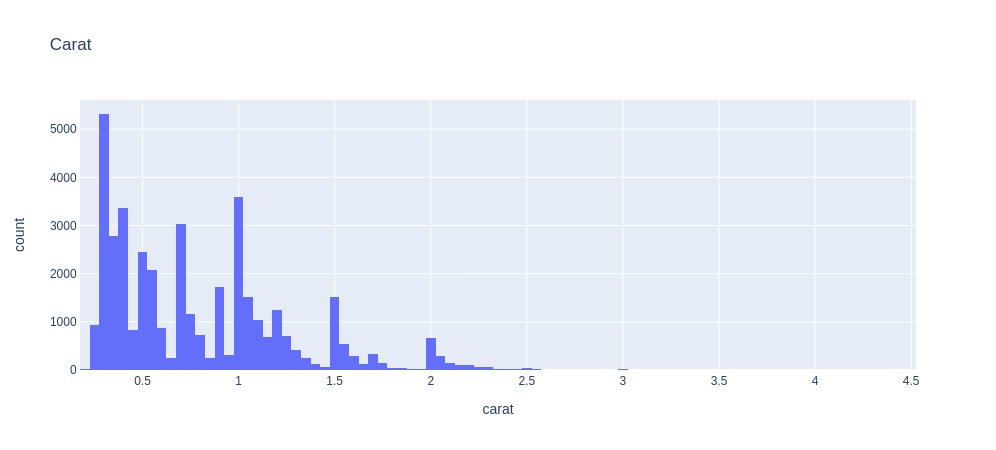

In [9]:
px.histogram(df, x='carat',orientation='v',title='Carat', nbins=100)

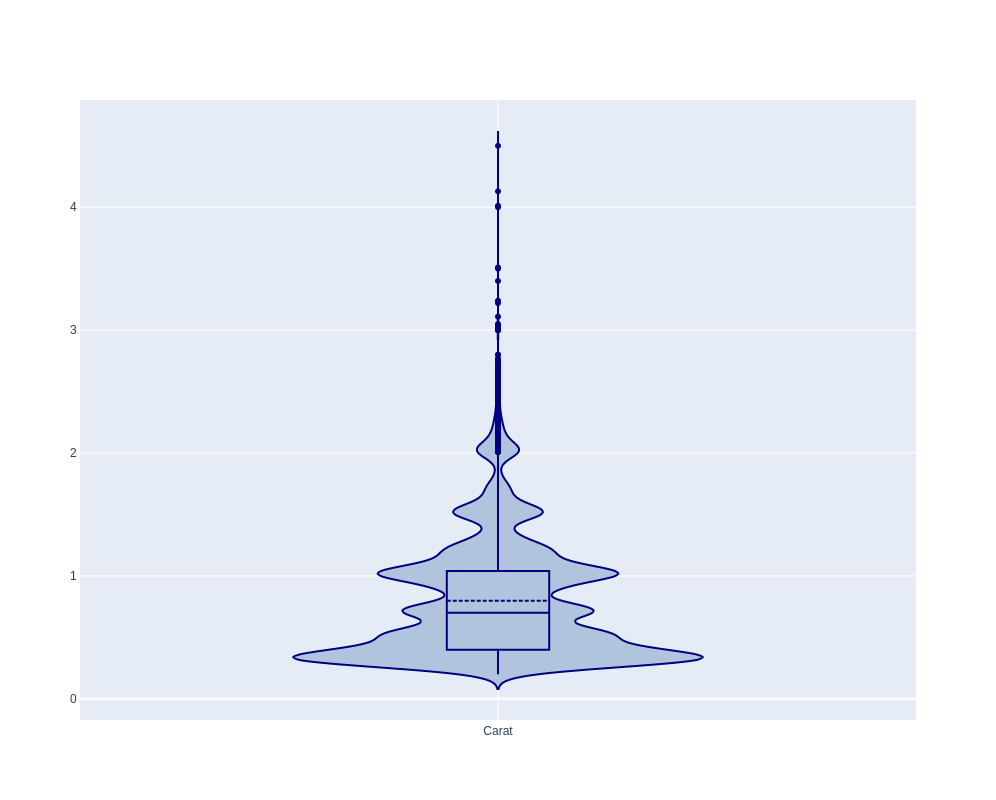

In [10]:
fig = go.Figure(data=go.Violin(y=df['carat'], box_visible=True,x0='Carat',meanline_visible=True,line_color='navy',fillcolor='lightsteelblue'))
fig.update_layout(height=800, width=1000)
fig.show()

In [11]:
df['cut'].describe()

count     40455
unique        5
top       Ideal
freq      16220
Name: cut, dtype: object

In [12]:
df['cut'].value_counts()

Ideal        16220
Premium      10260
Very Good     9095
Good          3663
Fair          1217
Name: cut, dtype: int64

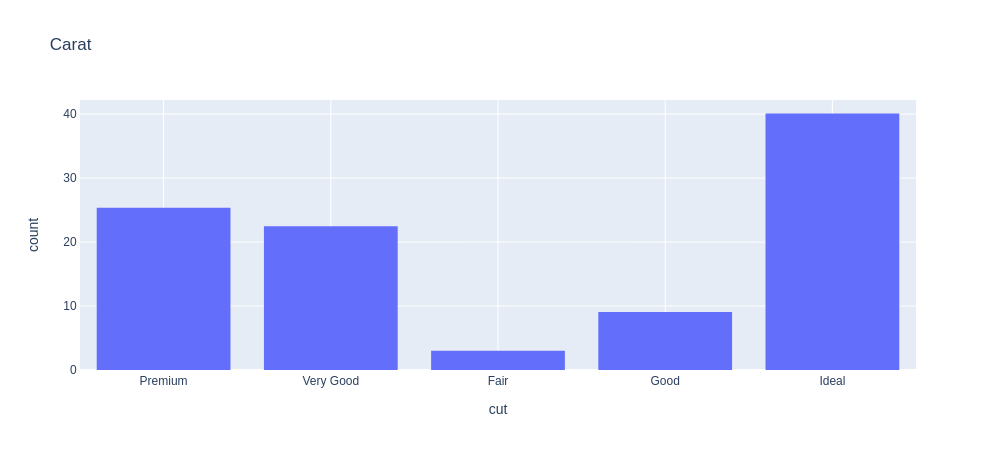

In [13]:
px.histogram(df, x='cut',orientation='v',title='Carat', nbins=100, histnorm='percent')

In [14]:
df['color'].describe()

count     40455
unique        7
top           G
freq       8455
Name: color, dtype: object

In [15]:
df['color'].value_counts()

G    8455
E    7325
F    7177
H    6277
D    5049
I    4032
J    2140
Name: color, dtype: int64

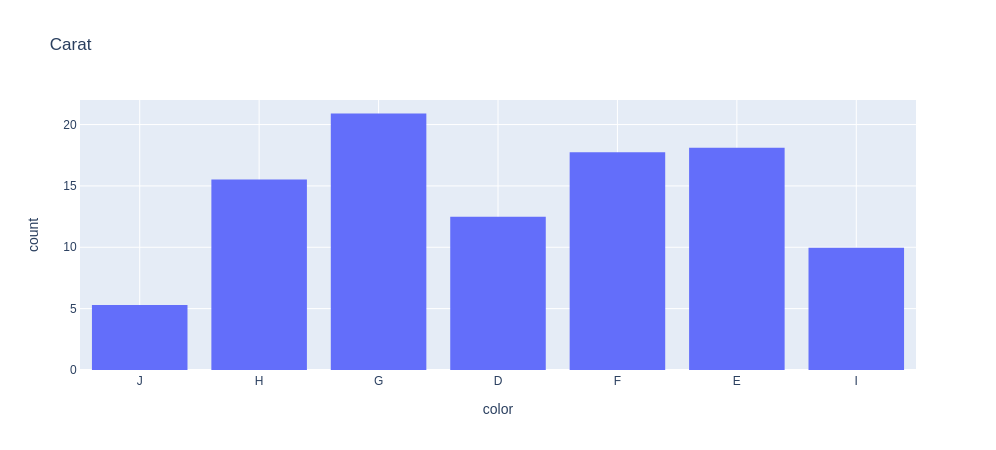

In [16]:
px.histogram(df, x='color',orientation='v',title='Carat', nbins=100,histnorm='percent')

In [17]:
df['clarity'].describe() #de la D en adelante mas claros a mas amarillos

count     40455
unique        8
top         SI1
freq       9749
Name: clarity, dtype: object

In [18]:
df['clarity'].value_counts() #iF > VVS1 > VVS2 > VS1 > VS2 > SI1 > SI2 > I1

SI1     9749
VS2     9248
SI2     6929
VS1     6066
VVS2    3799
VVS1    2774
IF      1327
I1       563
Name: clarity, dtype: int64

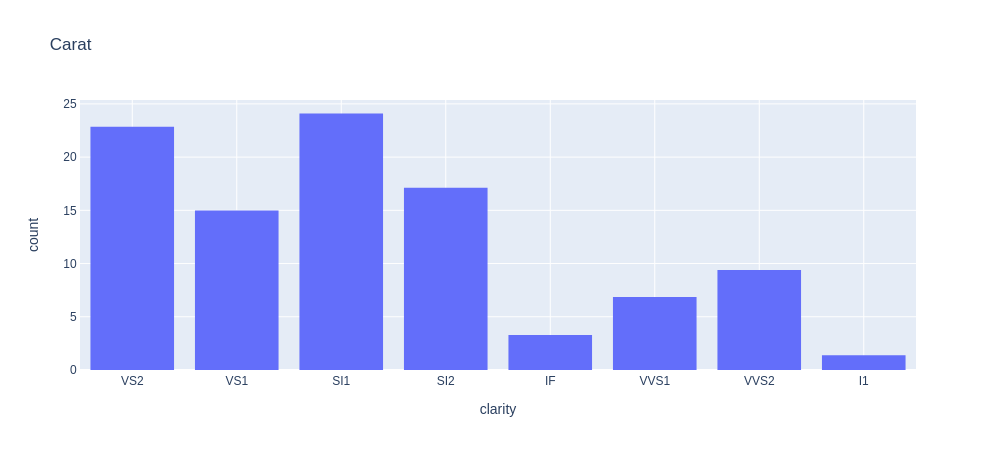

In [19]:
px.histogram(df, x='clarity',orientation='v',title='Carat', nbins=100,histnorm='percent')

In [20]:
df['depth'].describe() #diametro entre altura total, 90 casi igual de diametro que alto. depende de la shape

count    40455.000000
mean        61.752841
std          1.431725
min         43.000000
25%         61.000000
50%         61.800000
75%         62.500000
max         79.000000
Name: depth, dtype: float64

In [21]:
df['depth'].value_counts()

61.9    1647
62.0    1625
61.8    1561
62.1    1519
62.2    1512
        ... 
55.4       1
69.1       1
69.9       1
54.3       1
72.9       1
Name: depth, Length: 175, dtype: int64

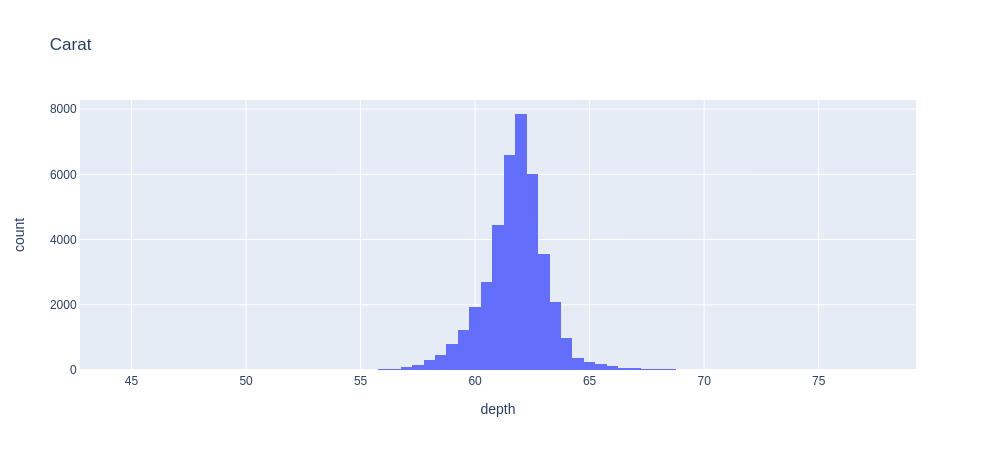

In [22]:
px.histogram(df, x='depth',orientation='v',title='Carat', nbins=100)

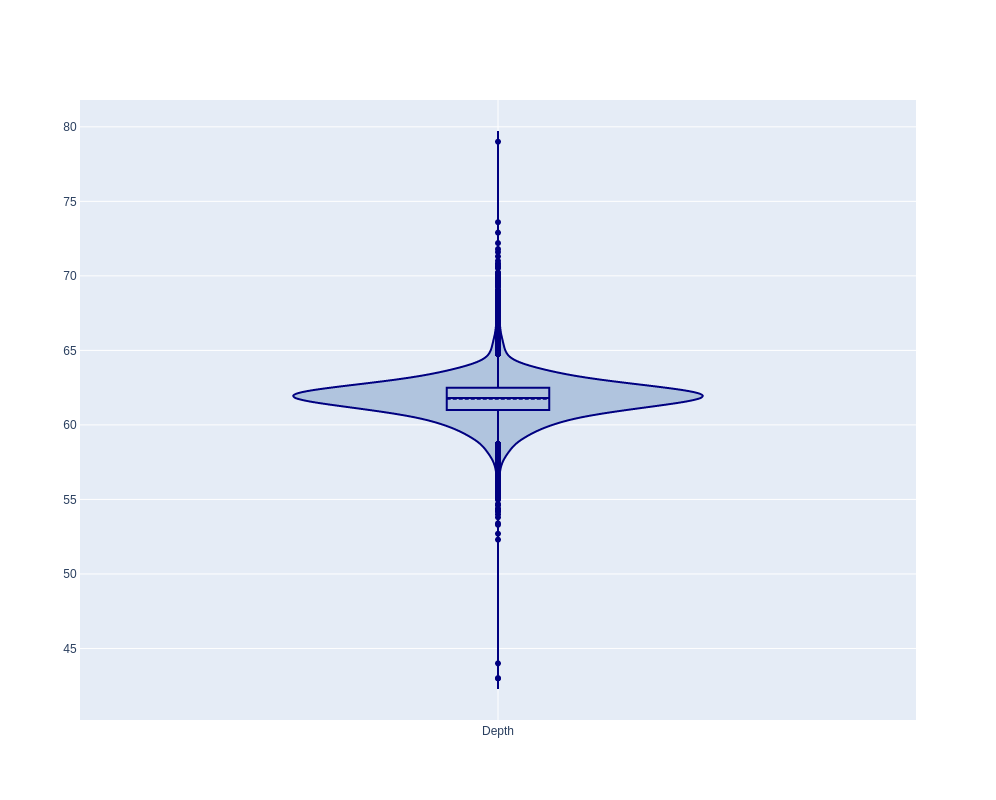

In [23]:
fig = go.Figure(data=go.Violin(y=df['depth'], box_visible=True,x0='Depth',meanline_visible=True,line_color='navy',fillcolor='lightsteelblue'))
fig.update_layout(height=800, width=1000)
fig.show()

In [24]:
df['table'].describe()   #cabeza porcentaje sobre el ancho total, depende de la shape

count    40455.000000
mean        57.446133
std          2.233535
min         43.000000
25%         56.000000
50%         57.000000
75%         59.000000
max         95.000000
Name: table, dtype: float64

In [25]:
df['table'].value_counts()

56.0    7477
57.0    7282
58.0    6290
59.0    4912
55.0    4699
        ... 
62.4       1
63.4       1
61.3       1
64.3       1
63.3       1
Name: table, Length: 121, dtype: int64

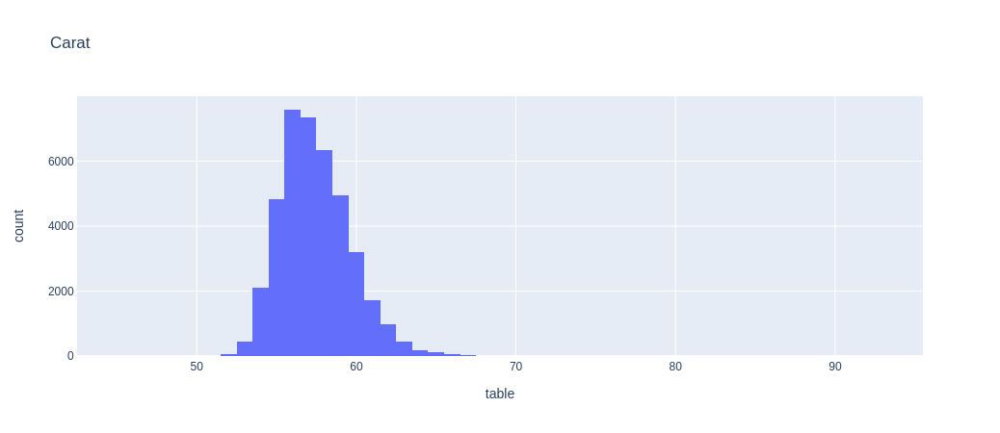

In [26]:
px.histogram(df, x='table',orientation='v',title='Carat', nbins=100)

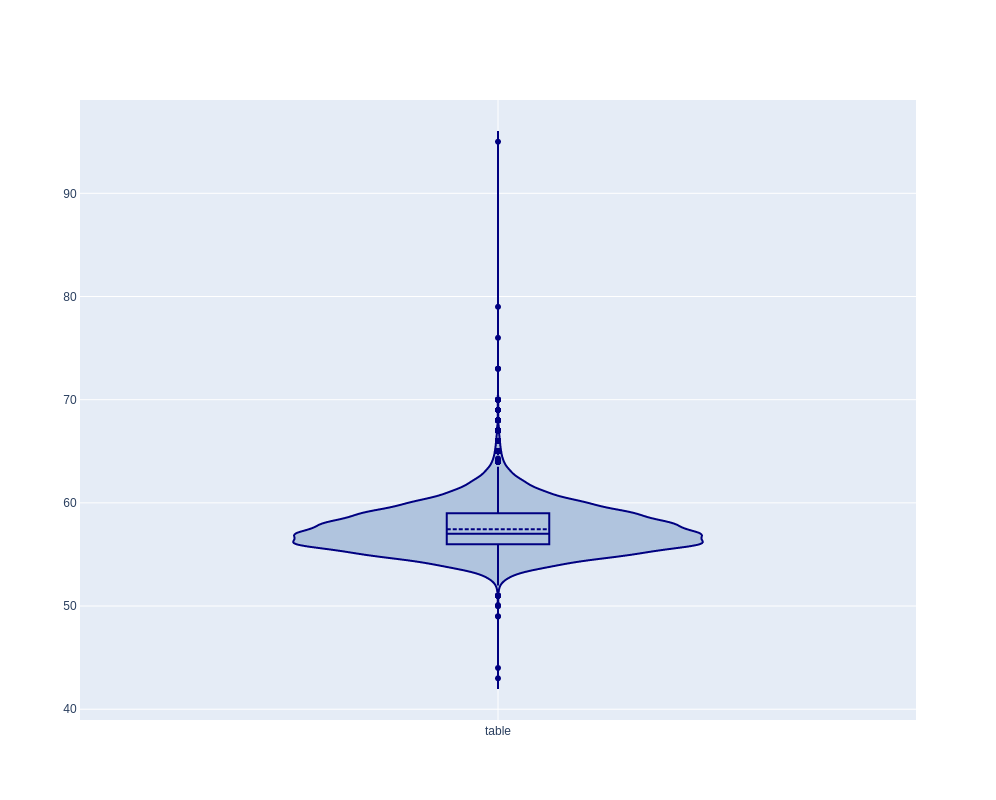

In [27]:
fig = go.Figure(data=go.Violin(y=df['table'], box_visible=True,x0='table',meanline_visible=True,line_color='navy',fillcolor='lightsteelblue'))
fig.update_layout(height=800, width=1000)
fig.show()

In [28]:
df['price'].describe()

count    40455.000000
mean      3928.444469
std       3992.416147
min        326.000000
25%        945.000000
50%       2397.000000
75%       5331.000000
max      18823.000000
Name: price, dtype: float64

In [29]:
df['price'].value_counts()

605      106
802       95
625       94
720       90
698       90
        ... 
13869      1
9775       1
7752       1
3658       1
3982       1
Name: price, Length: 10378, dtype: int64

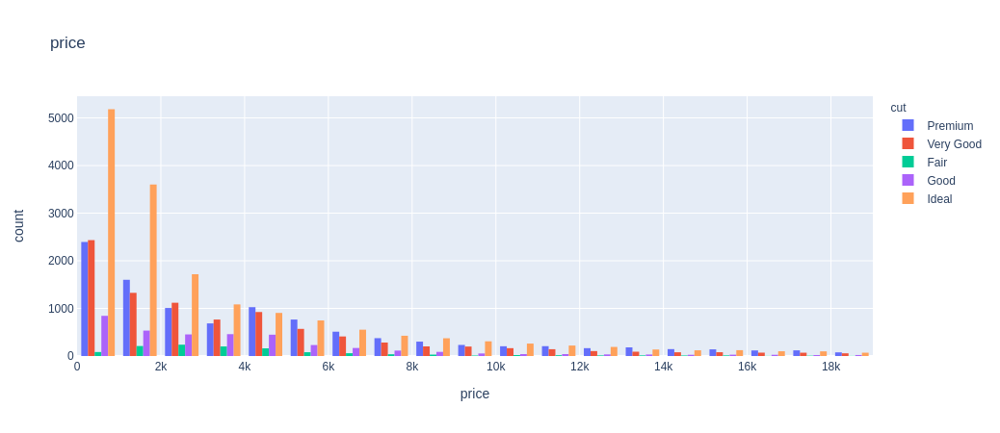

In [30]:
px.histogram(df, x='price',orientation='v',title='price', nbins=20, color='cut' , barmode='group')


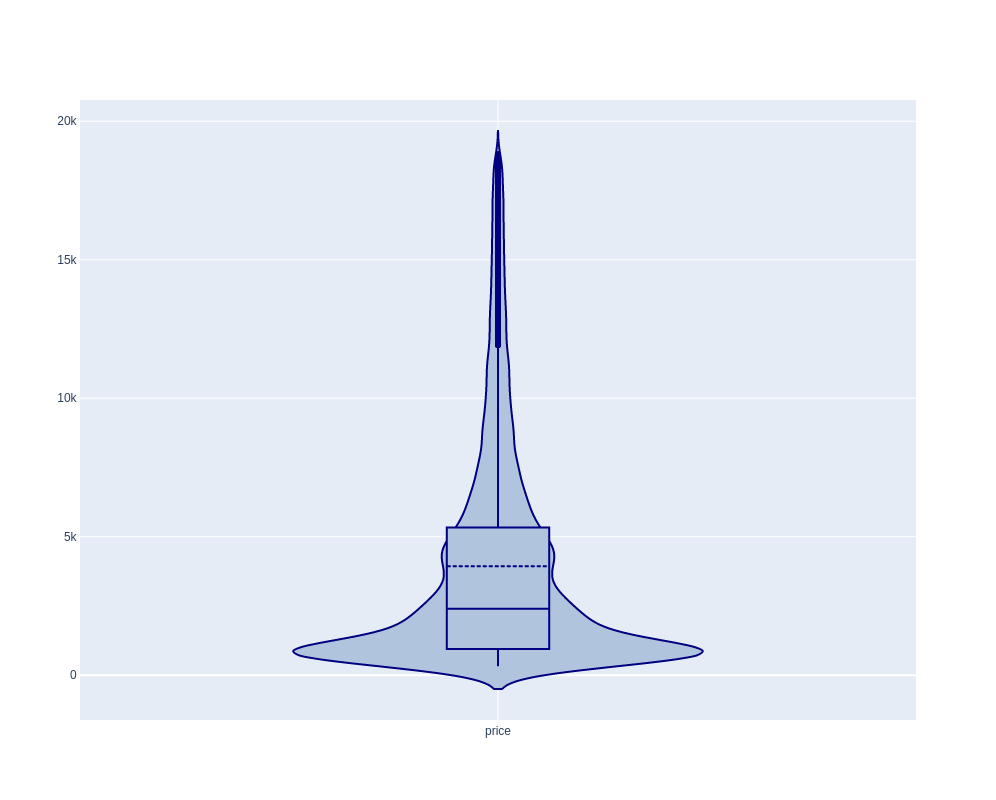

In [31]:
fig = go.Figure(data=go.Violin(y=df['price'], box_visible=True,x0='price',meanline_visible=True,line_color='navy',fillcolor='lightsteelblue'))
fig.update_layout(height=800, width=1000)
fig.show()

In [32]:
df['x'].describe()

count    40455.000000
mean         5.729392
std          1.124453
min          0.000000
25%          4.710000
50%          5.690000
75%          6.540000
max         10.230000
Name: x, dtype: float64

In [33]:
df['x'].value_counts()

4.37    353
4.34    331
4.38    330
4.33    326
4.32    321
       ... 
9.38      1
9.51      1
9.23      1
3.81      1
9.42      1
Name: x, Length: 543, dtype: int64

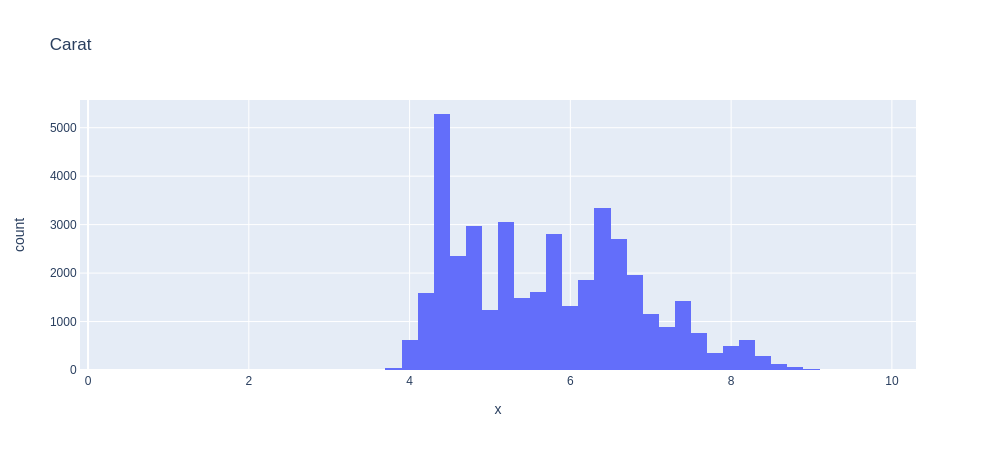

In [35]:
px.histogram(df, x='x',orientation='v',title='Carat', nbins=100)

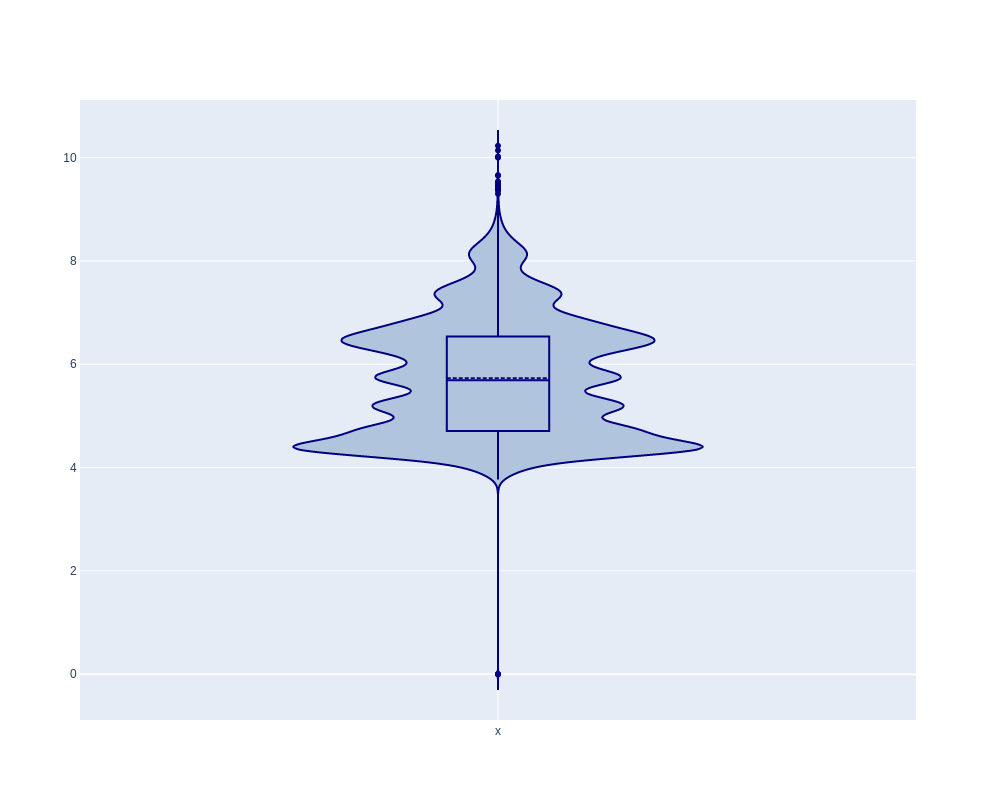

In [34]:
fig = go.Figure(data=go.Violin(y=df['x'], box_visible=True,x0='x',meanline_visible=True,line_color='navy',fillcolor='lightsteelblue'))
fig.update_layout(height=800, width=1000)
fig.show()

In [35]:
df['y'].describe()

count    40455.000000
mean         5.732819
std          1.146650
min          0.000000
25%          4.720000
50%          5.710000
75%          6.540000
max         58.900000
Name: y, dtype: float64

In [36]:
df['y'].value_counts()

4.37    334
4.34    332
4.32    326
4.39    322
4.35    319
       ... 
8.85      1
3.75      1
9.10      1
9.03      1
9.25      1
Name: y, Length: 539, dtype: int64

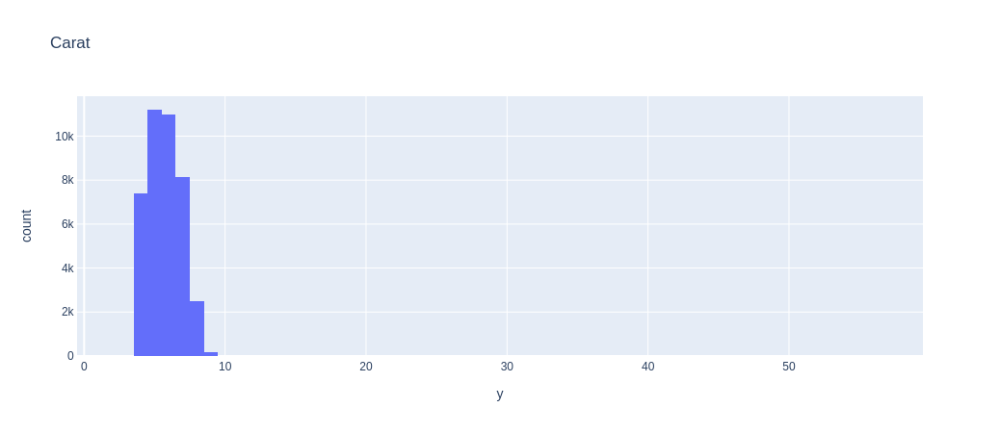

In [37]:
px.histogram(df, x='y',orientation='v',title='Carat', nbins=100)

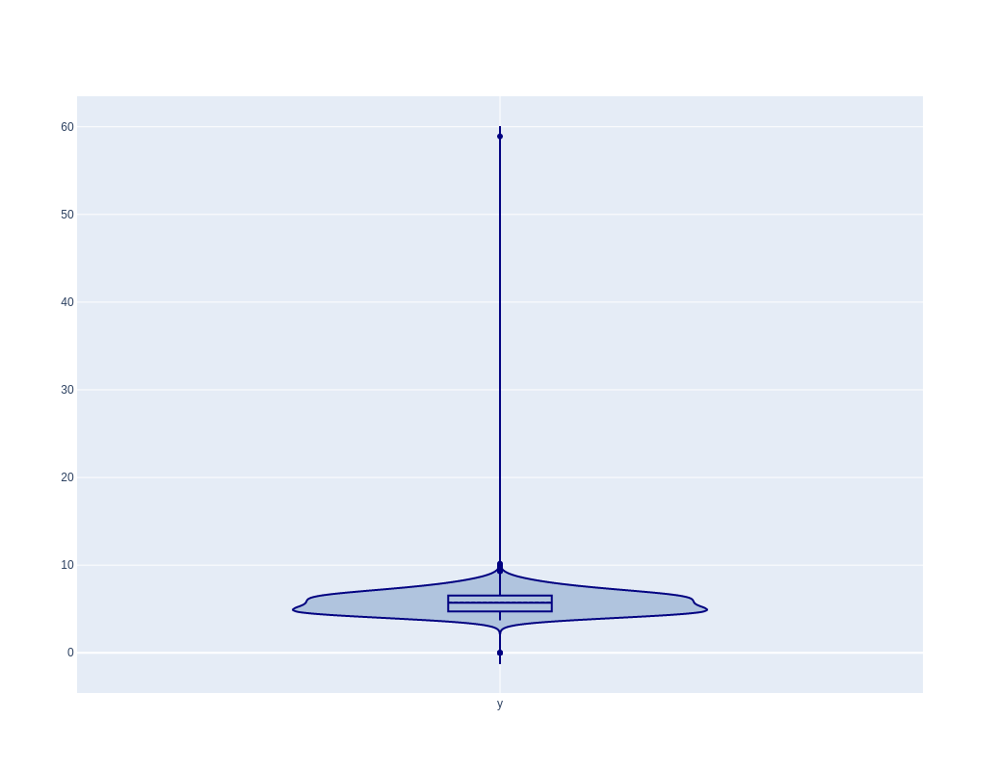

In [38]:
fig = go.Figure(data=go.Violin(y=df['y'], box_visible=True,x0='y',meanline_visible=True,line_color='navy',fillcolor='lightsteelblue'))
fig.update_layout(height=800, width=1000)
fig.show()

In [40]:
df[df['x']<3]

,carat,cut,color,clarity,depth,table,price,x,y,z
6465,0.71,Good,F,SI2,64.1,60.0,2130,0.0,0.00,0.0
14815,1.07,Ideal,F,SI2,61.6,56.0,4954,0.0,6.62,0.0
26192,2.25,Premium,H,SI2,62.8,59.0,18034,0.0,0.00,0.0
28029,0.71,Good,F,SI2,64.1,60.0,2130,0.0,0.00,0.0
34423,1.14,Fair,G,VS1,57.5,67.0,6381,0.0,0.00,0.0


In [39]:
df[df['y']>20]

,carat,cut,color,clarity,depth,table,price,x,y,z
14708,2.0,Premium,H,SI2,58.9,57.0,12210,8.09,58.9,8.06


In [59]:
df['z'].describe()

count    40455.000000
mean         3.537154
std          0.697062
min          0.000000
25%          2.910000
50%          3.520000
75%          4.035000
max          8.060000
Name: z, dtype: float64

In [60]:
df['z'].value_counts()

2.69    581
2.68    569
2.71    564
2.70    560
2.72    534
       ... 
5.65      1
5.51      1
6.17      1
5.85      1
1.53      1
Name: z, Length: 363, dtype: int64

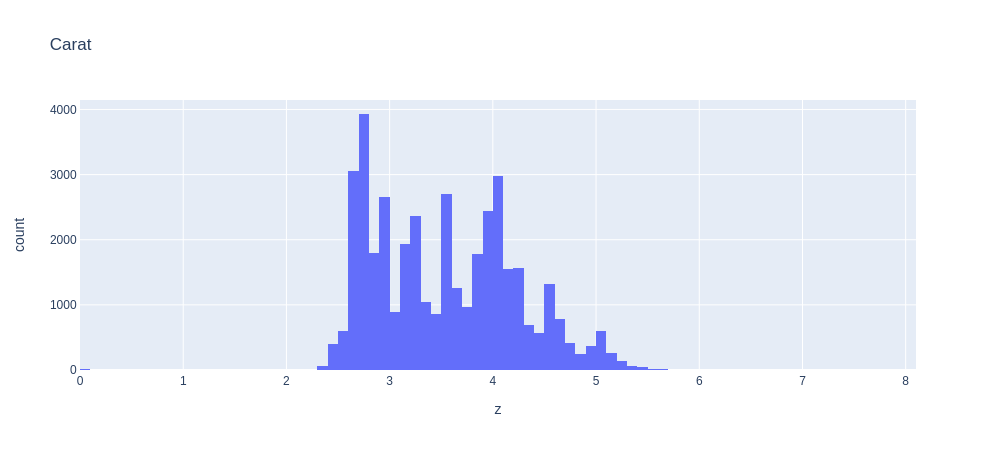

In [61]:
px.histogram(df, x='z',orientation='v',title='Carat', nbins=100)

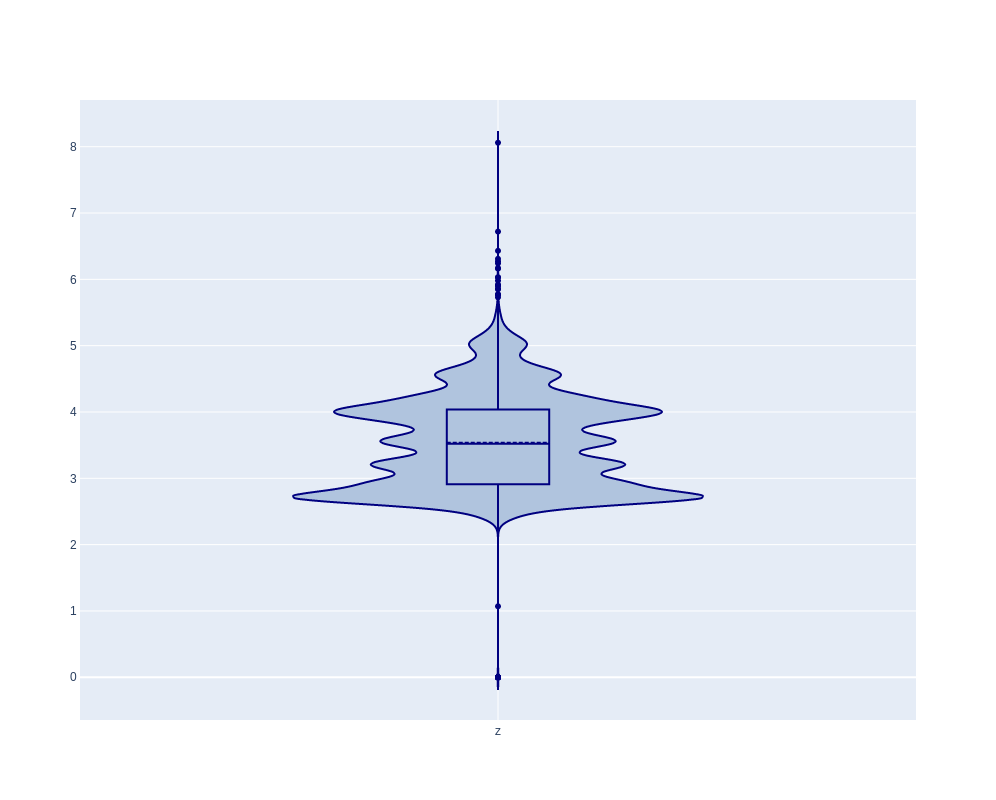

In [41]:
fig = go.Figure(data=go.Violin(y=df['z'], box_visible=True,x0='z',meanline_visible=True,line_color='navy',fillcolor='lightsteelblue'))
fig.update_layout(height=800, width=1000)
fig.show()

In [ ]:
#x anchura, y profundidad z altura 

# z 

#x e y forman el diametro table 

In [43]:
df.to_parquet('../data/processed/df.parquet')